# Intro

Welcome to the interactive labeling notebook!

The notebook proceeds as follows:

1. **Import** libraries
2. Define **paths** to data
3. **Label** ROI images using a simple GUI
4. **Visualize** results
5. **Save** results


<span style="background: orange; color: black;">
Note: Due to the GUI implementation, this notebook doesn't work in colab.
</span>

- If you need to restart a session, don't worry. Your results are continuously saved in the CSV file and you can just start from where you left off.
- We recommend labeling one session at a time so that the results can be saved with the data.

# Import libraries

Widen the notebook

In [113]:
# widen jupyter notebook window
from IPython.display import display, HTML
display(HTML("<style>.container {width:95% !important; }</style>"))
display(HTML("<style>:root { --jp-notebook-max-width: 100% !important; }</style>"))

Import basic libraries

In [114]:
from pathlib import Path
import tempfile

import numpy as np
from umap import UMAP
import matplotlib.pyplot as plt
import torch

Import `roicat`

In [115]:
import roicat

In [116]:
!pip show roicat

Name: roicat
Version: 1.4.6
Summary: A library for classifying and tracking ROIs.
Home-page: https://github.com/RichieHakim/ROICaT
Author: Richard Hakim
Author-email: 
License: LICENSE
Location: C:\Users\Samuel\anaconda3\envs\ROICaT\Lib\site-packages
Requires: 
Required-by: 


# Find paths to data

##### Prepare list of paths to data

In this example we are using suite2p output files, but other data types can be used (CaImAn, etc.) \
See the notebook on ingesting diverse data: https://github.com/RichieHakim/ROICaT/blob/main/notebooks/jupyter/other/demo_data_importing.ipynb

Make a list containing the paths to all the input files.

In this example we are using suite2p, so the following are defined:
1. `paths_allStat`: a list to all the stat.npy files
2. `paths_allOps`: a list with ops.npy files that correspond 1-to-1 with the stat.npy files

In [120]:
#dir_data = r'Y:/Subjects/SP058/2024-08-01/001/alf/FOV_05'
dir_data = r'Y:/Subjects/SP061/2025-02-24/001'

paths_stat_all = roicat.helpers.find_paths(
    dir_outer=dir_data,
    reMatch='stat\.npy',
    depth=3,
)

paths_stat = paths_stat_all
#paths_stat = [paths_stat_all[i] for i in [2,4,10,12]]
#display(paths_stat)

paths_ops = [str(Path(p).parent / 'ops.npy') for p in paths_stat]
paths_stacks = [str(Path(p).parent / 'meanImage.stack.tif') for p in paths_stat] #OPTIONAL in case we have stacks

display(paths_stacks)

['Y:\\Subjects\\SP061\\2025-02-24\\001\\alf\\FOV_00\\_suite2p_ROIData.raw\\meanImage.stack.tif',
 'Y:\\Subjects\\SP061\\2025-02-24\\001\\alf\\FOV_01\\_suite2p_ROIData.raw\\meanImage.stack.tif',
 'Y:\\Subjects\\SP061\\2025-02-24\\001\\alf\\FOV_02\\_suite2p_ROIData.raw\\meanImage.stack.tif',
 'Y:\\Subjects\\SP061\\2025-02-24\\001\\alf\\FOV_03\\_suite2p_ROIData.raw\\meanImage.stack.tif',
 'Y:\\Subjects\\SP061\\2025-02-24\\001\\alf\\FOV_04\\_suite2p_ROIData.raw\\meanImage.stack.tif',
 'Y:\\Subjects\\SP061\\2025-02-24\\001\\alf\\FOV_05\\_suite2p_ROIData.raw\\meanImage.stack.tif',
 'Y:\\Subjects\\SP061\\2025-02-24\\001\\alf\\FOV_06\\_suite2p_ROIData.raw\\meanImage.stack.tif',
 'Y:\\Subjects\\SP061\\2025-02-24\\001\\alf\\FOV_07\\_suite2p_ROIData.raw\\meanImage.stack.tif']

In [121]:
#get suite2p cell classifier scores
paths_iscell = list(np.unique([(Path(path) / '..' / 'iscell.npy').resolve() for path in paths_stat]))
display(paths_iscell)

iscell_byS = [np.load(path)[:,0] for path in paths_iscell]
class_byS = [np.load(path)[:,1] for path in paths_iscell]
iscell_all = np.concatenate(iscell_byS)
class_all = np.concatenate(class_byS)

#get functional metrics e.g. skew
stats_byS = [np.load(path,allow_pickle=True) for path in paths_stat]
stats_all = np.concatenate(stats_byS)
skews_all = [s['skew'] for s in stats_all]

[WindowsPath('//128.40.198.163/ibldata/Subjects/SP061/2025-02-24/001/alf/FOV_00/_suite2p_ROIData.raw/iscell.npy'),
 WindowsPath('//128.40.198.163/ibldata/Subjects/SP061/2025-02-24/001/alf/FOV_01/_suite2p_ROIData.raw/iscell.npy'),
 WindowsPath('//128.40.198.163/ibldata/Subjects/SP061/2025-02-24/001/alf/FOV_02/_suite2p_ROIData.raw/iscell.npy'),
 WindowsPath('//128.40.198.163/ibldata/Subjects/SP061/2025-02-24/001/alf/FOV_03/_suite2p_ROIData.raw/iscell.npy'),
 WindowsPath('//128.40.198.163/ibldata/Subjects/SP061/2025-02-24/001/alf/FOV_04/_suite2p_ROIData.raw/iscell.npy'),
 WindowsPath('//128.40.198.163/ibldata/Subjects/SP061/2025-02-24/001/alf/FOV_05/_suite2p_ROIData.raw/iscell.npy'),
 WindowsPath('//128.40.198.163/ibldata/Subjects/SP061/2025-02-24/001/alf/FOV_06/_suite2p_ROIData.raw/iscell.npy'),
 WindowsPath('//128.40.198.163/ibldata/Subjects/SP061/2025-02-24/001/alf/FOV_07/_suite2p_ROIData.raw/iscell.npy')]

In [122]:
stats_all[0].keys()

dict_keys(['ypix', 'xpix', 'lam', 'med', 'footprint', 'mrs', 'mrs0', 'compact', 'solidity', 'npix', 'npix_soma', 'soma_crop', 'overlap', 'radius', 'aspect_ratio', 'npix_norm_no_crop', 'npix_norm', 'skew', 'std', 'neuropil_mask'])

In [123]:
data = roicat.data_importing.Data_suite2p(
    paths_statFiles=paths_stat,
    paths_opsFiles=paths_ops,
    new_or_old_suite2p='new',
    verbose=True,
)

assert data.check_completeness(verbose=False)['classification_inference'], f"Data object is missing attributes necessary for tracking."

C:\Users\Samuel\anaconda3\envs\ROICaT\Lib\site-packages\roicat\util.py:417: UserWarning:

RH WARNING: unable to get gcc version. Got error: [WinError 2] The system cannot find the file specified



Starting: Importing FOV images from ops files
Completed: Set FOV_height and FOV_width successfully.
Completed: Imported 8 FOV images.
Setting FOV_images...
Completed: Set FOV_images for 8 sessions successfully.
Importing spatial footprints from stat files.


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:05<00:00,  1.42it/s]


Imported 8 sessions of spatial footprints into sparse arrays.
Completed: Set spatialFootprints for 8 sessions successfully.
Completed: Created session_bool.
Completed: Created centroids.
Starting: Creating centered ROI images from spatial footprints...
Completed: Created ROI images.


# ROInet embedding

This step passes the images of each ROI through the ROInet neural network. The inputs are the images, the output is an array describing the visual properties of each ROI.

##### 1. Initialize ROInet

Initialize the ROInet object. The `ROInet_embedder` class will automatically download and load a pretrained ROInet model. If you have a GPU, this step will be much faster.

In [124]:
DEVICE = roicat.helpers.set_device(use_GPU=True, verbose=True)
dir_temp = tempfile.gettempdir()

roinet = roicat.ROInet.ROInet_embedder(
    device=DEVICE,  ## Which torch device to use ('cpu', 'cuda', etc.)
    dir_networkFiles=dir_temp,  ## Directory to download the pretrained network to
    download_method='check_local_first',  ## Check to see if a model has already been downloaded to the location (will skip if hash matches)
    download_url='https://osf.io/c8m3b/download',  ## URL of the model
    download_hash='357a8d9b630ec79f3e015d0056a4c2d5',  ## Hash of the model file
    forward_pass_version='head',  ## How the data is passed through the network
    verbose=True,  ## Whether to print updates
)

roinet.generate_dataloader(
    ROI_images=data.ROI_images,  ## Input images of ROIs
    um_per_pixel=data.um_per_pixel,  ## Resolution of FOV
    pref_plot=False,  ## Whether or not to plot the ROI sizes
);
images = roinet.ROI_images_rs

Using device: cpu


C:\Users\Samuel\anaconda3\envs\ROICaT\Lib\site-packages\roicat\util.py:417: UserWarning:

RH WARNING: unable to get gcc version. Got error: [WinError 2] The system cannot find the file specified



File already exists locally: C:\Users\Samuel\AppData\Local\Temp\ROInet.zip
Hash of local file does not match provided hash_hex.
Hash of local file: 7a5fb8ad94b110037785a46b9463ea94
Hash provided in hash_hex: 357a8d9b630ec79f3e015d0056a4c2d5


  0%|          | 0.00/100M [00:00<?, ?B/s]

Hash of downloaded file matches hash_hex.
Extracting C:\Users\Samuel\AppData\Local\Temp\ROInet.zip to C:\Users\Samuel\AppData\Local\Temp.
Completed zip extraction.
Imported model from C:\Users\Samuel\AppData\Local\Temp\ROInet_classification_20220902\model.py
Loaded params_model from C:\Users\Samuel\AppData\Local\Temp\ROInet_classification_20220902\params.json


C:\Users\Samuel\anaconda3\envs\ROICaT\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning:

The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.

C:\Users\Samuel\anaconda3\envs\ROICaT\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning:

Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ConvNeXt_Tiny_Weights.IMAGENET1K_V1`. You can also use `weights=ConvNeXt_Tiny_Weights.DEFAULT` to get the most up-to-date weights.



Generated network using params_model
Loaded state_dict into network from C:\Users\Samuel\AppData\Local\Temp\ROInet_classification_20220902\ConvNext_tiny__1_0_unfrozen__simCLR.pth
Loaded network onto device cpu
Starting Image Resizer
Creating dataloader
Defined image transformations: Sequential(
  (0): ScaleDynamicRange(scaler_bounds=(0, 1))
  (1): Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
  (2): TileChannels(dim=0)
)
Defined dataset
Defined dataloader


##### 2. Check ROI_images sizes
In general, you want to see that a neuron fills roughly 25-50% of the area of the image. \
**Adjust `um_per_pixel` above to rescale image size**


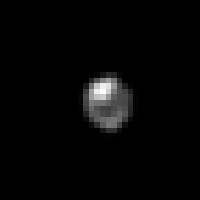

In [125]:
roicat.visualization.display_toggle_image_stack(images[:1000], image_size=(200,200))

##### 3. Pass data through network

Pass the data through the network. Expect for large datasets (~40,000 ROIs) that this takes around 15 minutes on CPU or 1 minute on GPU.

In [126]:
roinet.generate_latents();

starting: running data through network


  0%|          | 0/2149 [00:01<?, ?it/s]

completed: running data through network


# UMAP embedding

Reduce the dimensionality of the output of ROInet (~100 dims) to 2 dimensions so that we can visualize it. Feel free to use any settings here that do a good job of clustering your data as you see fit.

In [127]:
model_umap = UMAP(
    n_neighbors=50, #50 (local v. global structure)
    n_components=2, #2 (dimensions of embedding)
    n_epochs=400, 
    min_dist=0.1, #0.1 (minimum distance between points, i.e. 'clumpiness' of embedding)
    verbose=True,
    densmap=False,
)
emb = model_umap.fit_transform(roinet.latents)

UMAP(n_epochs=400, n_neighbors=50, verbose=True)
Fri Feb 28 15:18:07 2025 Construct fuzzy simplicial set
Fri Feb 28 15:18:07 2025 Finding Nearest Neighbors
Fri Feb 28 15:18:07 2025 Building RP forest with 12 trees
Fri Feb 28 15:18:07 2025 NN descent for 14 iterations
	 1  /  14
	 2  /  14
	 3  /  14
	Stopping threshold met -- exiting after 3 iterations
Fri Feb 28 15:18:08 2025 Finished Nearest Neighbor Search
Fri Feb 28 15:18:08 2025 Construct embedding


Epochs completed:   0%|            0/400 [00:00]

	completed  0  /  400 epochs
	completed  40  /  400 epochs
	completed  80  /  400 epochs
	completed  120  /  400 epochs
	completed  160  /  400 epochs
	completed  200  /  400 epochs
	completed  240  /  400 epochs
	completed  280  /  400 epochs
	completed  320  /  400 epochs
	completed  360  /  400 epochs
Fri Feb 28 15:18:29 2025 Finished embedding


# Label data

How to use this GUI:
- Each image will be shown one at a time. You can go to previous and next images by using the ***Left*** and ***Right*** arrow keys, and can close the GUI by pressing the ***Escape*** key.
- An embedding of the ROIs will be shown on the right with example images overlaid onto the scatterplot. You can use the lasso tool to draw a region around a section of the scatter plot to select ROIs for labeling, the selected ROIs will be made available to move through and label on the left. 
- You can turn off the overlays by pressing Control-Shift-T

Labeling:
- Identify several target regions in the embedding space. Lasso each region, and label a bunch of examples from within that region. 
- Label the image by pressing any key on your keyboard. This key will be used as the label. After each key press, the following occurs:
    1. The results will be saved as a CSV file at `path_csv` (will be a temporary file if not specified)
    2. The results will also be stored in the python object as `ImageLabeler_obj.labels_`.
    2. The GUI should progress to the next image.
    3. Finish labeling by closing out of the GUI window or pressing the user defined '`end_key`' (***Escape*** by default).
- The results are stored in a temporary CSV file with two columns: 'index' and 'label'. This file can be used to recover lost labeling session data. We will save more comprehensive results files at the end of the notebook.
    - **'index'**: The index within the data object. 0-indexed.
    - **'label'**: The key pressed for that image in the labeling GUI.

In [128]:
# The images are what we will label and will be shown on the left
images = np.concatenate(data.ROI_images, axis=0) 

# The idx to the overlay images is designed to pick images to show that
# are well spread out in the embedding space from UMAP
idx_images_overlay = roicat.visualization.get_spread_out_points(
    emb,
    n_ims=min(emb.shape[0], 1500),  ## Select number of overlayed images here
    dist_im_to_point=0.8,
)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
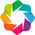

:Overlay
   .Points.I :Points   [x,y]
   .RGB.I    :RGB   [x,y]   (R,G,B,A)

In [129]:
fn_get_indices, layout, path_tempFile = roicat.visualization.select_region_scatterPlot(
    data=emb,
    idx_images_overlay=idx_images_overlay,
    images_overlay=images[idx_images_overlay, 6:30, 6:30], 
    size_images_overlay=0.25,
    frac_overlap_allowed=0.25,
    figsize=(1200,1200),
    alpha_points=0.5,
    size_points=1,
    color_points='r',
);

In [130]:
#these are the only 3 features used by the s2p classifier!!
#['skew', 'compact', 'npix_norm']
default_classifier = np.load('C:/Users/Samuel/suite2p/suite2p/classifiers/classifier.npy',allow_pickle=True).item()
np.shape(default_classifier['stats'])

(14058, 3)

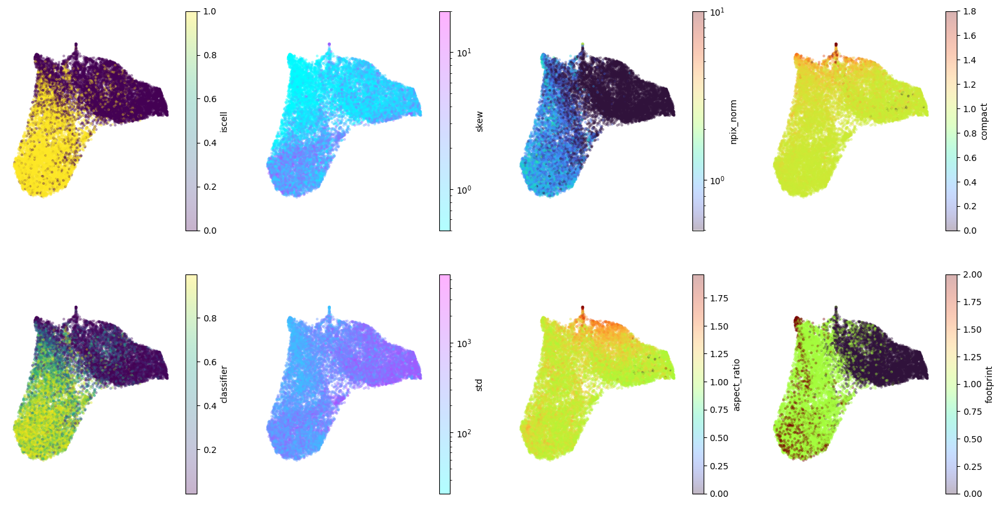

In [131]:
#plot the embedding colored by the s2p classifier and the various features contained in the stats file

import matplotlib as mpl
savedir = r'C:/Users/Samuel/Documents/2PI/mesoscope_active/roicat/figures/'

fig, ax = plt.subplots(nrows=2,ncols=4, figsize=(20,10), sharex=True, sharey=True)

#s2p classifier
h00 = ax[0, 0].scatter(emb[:,0],emb[:,1],5,iscell_all,alpha=0.3)
ax[0, 0].set_box_aspect(1)
plt.colorbar(h00, ax=ax[0, 0], label = 'iscell')
ax[0, 0].axis('off')

h10 = ax[1, 0].scatter(emb[:,0],emb[:,1],5,class_all,alpha=0.3)
ax[1, 0].set_box_aspect(1)
plt.colorbar(h10, ax=ax[1, 0], label = 'classifier')
ax[1, 0].axis('off')

#s2p functional metrics
h01 = ax[0, 1].scatter(emb[:,0],emb[:,1],5,skews_all,alpha=0.3, norm=mpl.colors.LogNorm(vmin=0.5, vmax=20), cmap='cool')
ax[0, 1].set_box_aspect(1)
plt.colorbar(h01, ax=ax[0, 1], label = 'skew')
ax[0, 1].axis('off')

h11 = ax[1, 1].scatter(emb[:,0],emb[:,1],5,[s['std'] for s in stats_all],alpha=0.3,norm=mpl.colors.LogNorm(), cmap='cool')
ax[1, 1].set_box_aspect(1)
plt.colorbar(h11, ax=ax[1, 1], label = 'std')
ax[1, 1].axis('off')

#s2p structural metrics

#h02 = ax[0, 2].scatter(emb[:,0],emb[:,1],5,[s['radius'] for s in stats_all],alpha=0.3, vmin=2, vmax=30, cmap='turbo')
#ax[0, 2].set_box_aspect(1)
#plt.colorbar(h02, ax=ax[0, 2], label = 'radius')
#ax[0, 2].axis('off')

h02 = ax[0, 2].scatter(emb[:,0],emb[:,1],5,[s['npix_norm'] for s in stats_all],alpha=0.3,  norm=mpl.colors.LogNorm(vmin=0.5, vmax=10), cmap='turbo')
ax[0, 2].set_box_aspect(1)
plt.colorbar(h02, ax=ax[0, 2], label = 'npix_norm')
ax[0, 2].axis('off')
            
h12 = ax[1, 2].scatter(emb[:,0],emb[:,1],5,[s['aspect_ratio'] for s in stats_all],alpha=0.3, cmap='turbo')
ax[1, 2].set_box_aspect(1)
plt.colorbar(h12, ax=ax[1, 2], label = 'aspect_ratio')
ax[1, 2].axis('off')
            
h03 = ax[0, 3].scatter(emb[:,0],emb[:,1],5,[s['compact'] for s in stats_all], vmax=1.8, alpha=0.3, cmap='turbo')
ax[0, 3].set_box_aspect(1)
plt.colorbar(h03, ax=ax[0, 3], label = 'compact')
ax[0, 3].axis('off')

h13 = ax[1, 3].scatter(emb[:,0],emb[:,1],5,[s['footprint'] for s in stats_all],alpha=0.3, cmap='turbo')
ax[1, 3].set_box_aspect(1)
plt.colorbar(h13, ax=ax[1, 3], label = 'footprint')
ax[1, 3].axis('off')

figname = 'emb_s2pfeatures'
#fig.savefig(savedir+figname+'.png',transparent=True)
#fig.savefig(savedir+figname+'.svg',transparent=True)

#plt.scatter(emb[:,0],emb[:,1],5,np.array(skews_all)<0,alpha=0.3, cmap='cool')
##plt.scatter(emb[:,0],emb[:,1],5,skews_all,alpha=0.3, vmin=0, vmax=10)
#plt.colorbar(label = 'skew')
#plt.show()

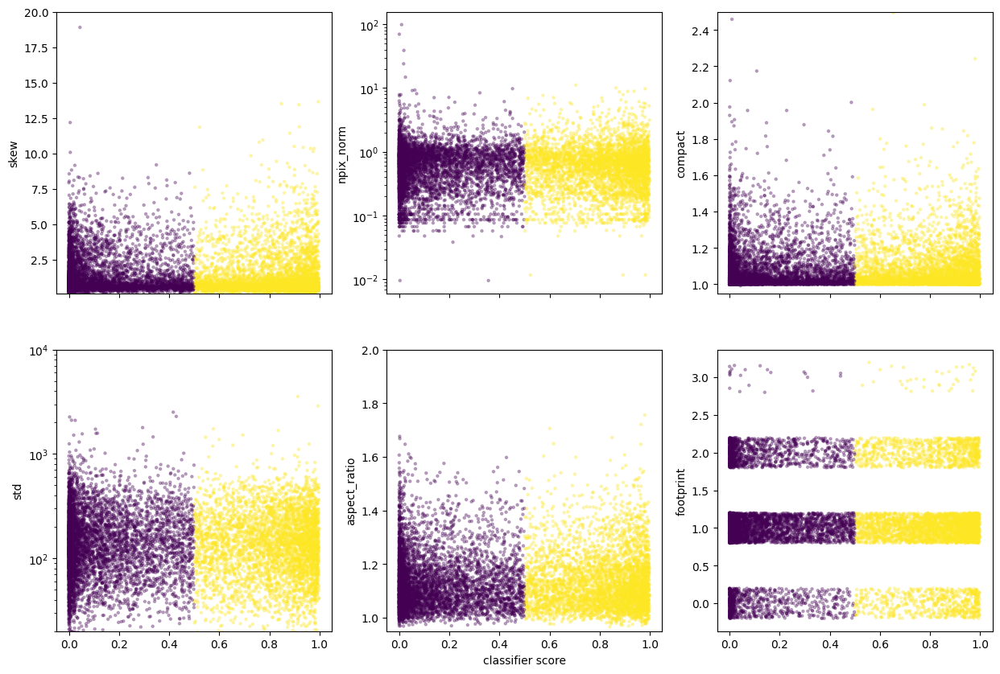

In [99]:
#plot relationships between different s2p metrics and the s2p classifier score

fig, ax = plt.subplots(nrows=2,ncols=3, figsize=(15,10), sharex=True)

ax[0,0].scatter(class_all,skews_all,5,iscell_all,alpha=0.3)
ax[0,0].set_ylim((0.1,20))
#ax[0,0].set_yscale('log')
ax[0,0].set_ylabel('skew')

ax[1,0].scatter(class_all,[s['std'] for s in stats_all],5,iscell_all,alpha=0.3)
ax[1,0].set_ylim((20,10000))
ax[1,0].set_yscale('log')
ax[1,0].set_ylabel('std')

#ax[0,1].scatter(class_all,[s['radius'] for s in stats_all],5,iscell_all,alpha=0.3)
##ax[0,1].set_ylim((2,30))
#ax[0,1].set_yscale('log')
#ax[0,1].set_ylabel('radius')

ax[0,1].scatter(class_all,[s['npix_norm'] for s in stats_all],5,iscell_all,alpha=0.3)
#ax[0,1].set_ylim((2,30))
ax[0,1].set_yscale('log')
ax[0,1].set_ylabel('npix_norm')

ax[1,1].scatter(class_all,[s['aspect_ratio'] for s in stats_all],5,iscell_all,alpha=0.3)
ax[1,1].set_ylim((0.95,2))
ax[1,1].set_ylabel('aspect_ratio')
ax[1,1].set_xlabel('classifier score')

ax[0,2].scatter(class_all,[s['compact'] for s in stats_all],5,iscell_all,alpha=0.3)
ax[0,2].set_ylim((0.95,2.5))
#ax[0,2].set_yscale('log')
ax[0,2].set_ylabel('compact')

ax[1,2].scatter(class_all,[s['footprint'] for s in stats_all]+0.4*(np.random.random(size=(1,len(stats_all)))-0.5),5,iscell_all,alpha=0.3)
#ax[1,2].set_ylim((0.8,2))
ax[1,2].set_ylabel('footprint')

figname = 'class_s2pfeatures'
#fig.savefig(savedir+figname+'.png',transparent=True)
#fig.savefig(savedir+figname+'.svg',transparent=True)

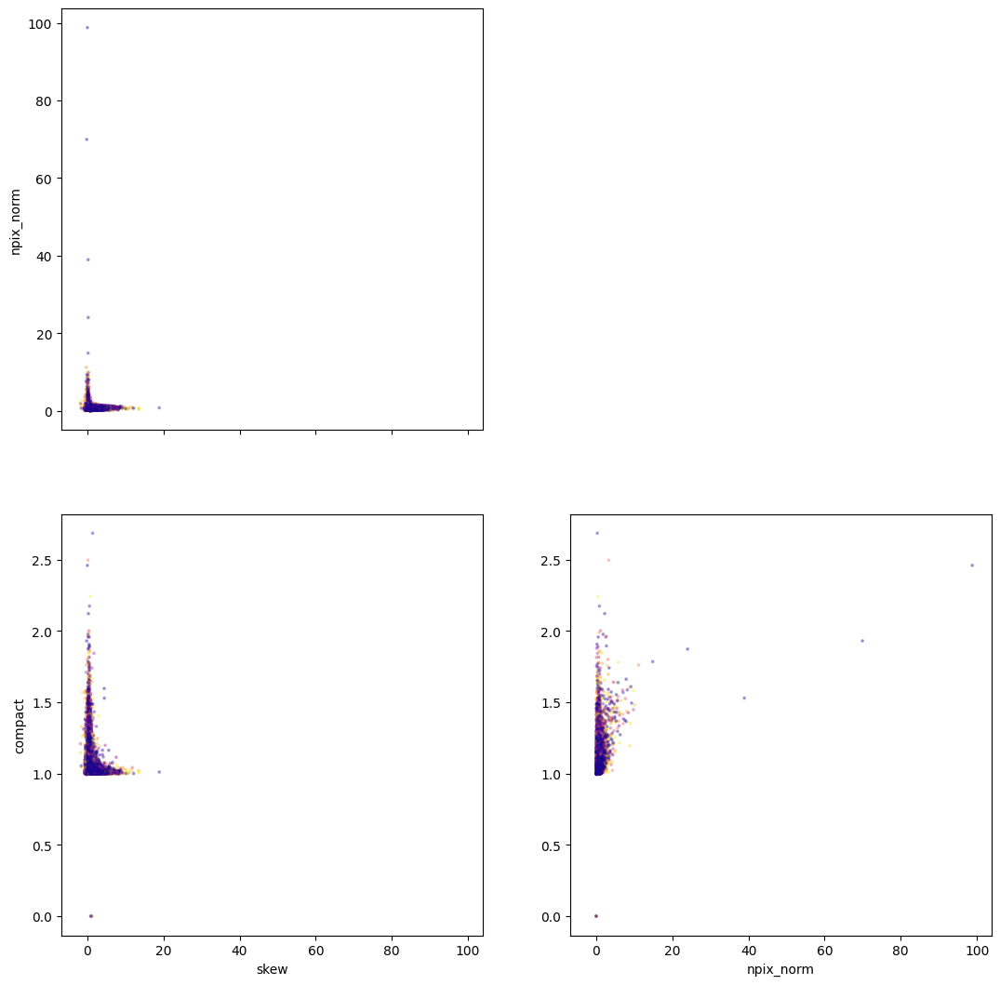

In [100]:
fig, ax = plt.subplots(nrows=3,ncols=3, figsize=(20,20), sharex=True)

ax[1,0].scatter([s['skew'] for s in stats_all],[s['npix_norm'] for s in stats_all],3,class_all,alpha=0.3,cmap='plasma')
#ax[1,0].set_xlabel('skew')
ax[1,0].set_ylabel('npix_norm')
ax[1,0].set_box_aspect(1)
#ax.set_scale('log')

ax[2,0].scatter([s['skew'] for s in stats_all],[s['compact'] for s in stats_all],3,class_all,alpha=0.3,cmap='plasma')
ax[2,0].set_xlabel('skew')
ax[2,0].set_ylabel('compact')
ax[2,0].set_box_aspect(1)

ax[2,1].scatter([s['npix_norm'] for s in stats_all],[s['compact'] for s in stats_all],3,class_all,alpha=0.3,cmap='plasma')
ax[2,1].set_xlabel('npix_norm')
#ax[2,1].set_ylabel('compact')
ax[2,1].set_box_aspect(1)

ax[0,0].set_visible(False)
ax[1,1].set_visible(False)
ax[2,2].set_visible(False)
ax[0,1].set_visible(False)
ax[0,2].set_visible(False)
ax[1,2].set_visible(False)

figname = 'class_s2pfeatures_multiscatter'
#fig.savefig(savedir+figname+'.png',transparent=True)
#fig.savefig(savedir+figname+'.svg',transparent=True)

In [101]:
import plotly.express as px
import pandas as pd
import plotly.graph_objects as go
import imageio

df = pd.DataFrame(list(stats_all))
df["class_score"] = class_all
df["iscell"] = class_all>0.5

fig = px.scatter_3d(df, x='skew', y='npix_norm', z='compact',
                   log_x=False, log_y=False, log_z=False,
                   range_x=[-2,15], range_y=[-0.1,6], range_z=[0.9,3],
                   color='class_score',opacity=.3,size_max=10)
fig.update_layout(width=1200, height=1000)
fig.update_traces(marker=dict(size=3))


fig.show()

In [132]:
#helper function for cropping mean FOV image
def crop_cluster_im_square(im: np.ndarray, center: np.ndarray, sz: int=36, norm=True) -> np.ndarray:
    """
    Crops the image to a square of fixed size, centered around its center-of-mass. 
    SP 2025

    Args:
        im (np.ndarray):  
            Image to crop. (shape: *(H, W)*) 
        center (np.ndarray):
            center coords y, x (shape: (2))
        sz (int):
            width/height of square in pixels
        norm (Boolean)
            whether or not to normalize the gray values

    Returns:
        (np.ndarray): 
            im_out (np.ndarray): 
                Cropped image. (shape: *(sz, sz)*) 
    """
    from scipy.ndimage import center_of_mass

    if sz % 2 == 0:
        sz_odd = sz-1
    else:
        sz_odd = sz

    if np.all(np.isnan(im)) or np.all(im==0):
        im_out = np.zeros((sz,sz)).astype(np.float32)
    else:
        com_y = center[0]
        com_x = center[1]
        # Define edges of cropping square
        y_min = max(0, int(com_y) - (sz_odd+1) // 2)
        x_min = max(0, int(com_x) - (sz_odd+1) // 2)
        y_max = min(im.shape[0], int(com_y) + (sz_odd+1) // 2)
        x_max = min(im.shape[1], int(com_x) + (sz_odd+1) // 2)
        # Crop the image
        im_out = im[y_min:y_max, x_min:x_max]

        #optionally do some local min-max normalization
        if norm:
            sz_mid = 15
            y_min_mid = max(0, int(com_y) - sz_mid)
            x_min_mid = max(0, int(com_x) - sz_mid)
            y_max_mid = min(im.shape[0], int(com_y) + sz_mid)
            x_max_mid = min(im.shape[1], int(com_x) + sz_mid)
            im_mid = im[y_min_mid:y_max_mid, x_min_mid:x_max_mid]
            #im_out = (255*((im_out - im_mid.min()) / (im_mid.max() - im_mid.min()))).astype(np.uint8)
            im_out = ((im_out - im_mid.min()) / (im_mid.max() - im_mid.min())).astype(np.float32)
            im_out[im_out>1] = 1
            im_out[im_out<0] = 0
    
    # If the cropped region is smaller than the requested size, pad it
    pad_y = sz - im_out.shape[0]
    pad_x = sz - im_out.shape[1]
    if pad_y > 0 or pad_x > 0:
        im_out = np.pad(im_out, ((pad_y,0), (pad_x,0)), mode='constant', constant_values=0)
    
    return im_out


In [142]:
#for each ROI, obtain cropped mean image at centroid, with the ROI mask overlaid

from scipy.ndimage import center_of_mass
import tifffile as tiff

def load_tiff_stack(file_path):
    """Loads a multi-page TIFF file as a NumPy array."""
    with tiff.TiffFile(file_path) as tif:
        stack = tif.asarray(out='memmap').astype(np.float32)
        
    min_val = stack.min()
    max_val = stack.max()

    if max_val > min_val:
        stack = (stack - min_val) / (max_val - min_val)
    else:
        stack.fill(0)  # If all values are the same, set all to zero

    return stack

#OPTION 1: use 'enhanced mean image' computed by suite2p and loaded by ROICaT by default
#meanImgs = data.FOV_images

#OPTION 2: use raw mean image
#meanImgs = np.array([np.load(p, allow_pickle=True).item()['meanImg'] for p in paths_ops])
#meanImgs = (meanImgs_raw - meanImgs_raw.min(axis=(1,2), keepdims=True)) / (meanImgs_raw.max(axis=(1,2), keepdims=True) - meanImgs_raw.min(axis=(1,2), keepdims=True))

#OPTION 3: use stack
#meanImgs = np.array([np.repeat(np.load(p, allow_pickle=True).item()['meanImg'][np.newaxis, :, :], 10, axis=0) for p in paths_ops]) #just for testing
meanImgs = np.array([load_tiff_stack(p) for p in paths_stacks])
    
meanImgs_masks = data.ROI_images
sfs = data.spatialFootprints
sz = 60

#images2 = np.repeat(images[:,:,:,np.newaxis],3,axis=3)
images2 = np.zeros((len(images),np.shape(meanImgs)[1],sz,sz,3),dtype=np.float32)
cnt = 0

for i, FOV_im in enumerate(meanImgs):

    for j, roi_im_sparse in enumerate(sfs[i]):

        roi_im = roi_im_sparse.reshape(data.FOV_height, data.FOV_width).toarray()
        com_y, com_x = center_of_mass(roi_im)
        
        mIm_cropped_raw = np.array([crop_cluster_im_square(im,np.array([com_y+4, com_x]),sz,norm=False) for im in FOV_im])
        #mIm_cropped = (mIm_cropped_raw - mIm_cropped_raw.min()) / (mIm_cropped_raw.max() - mIm_cropped_raw.min()).astype(np.float32)
        sz_mid = 15
        im_mid = mIm_cropped_raw[:, 15:45, 15:45]
        mIm_cropped = ((mIm_cropped_raw - im_mid.min()) / (im_mid.max() - im_mid.min())).astype(np.float32)
        mIm_cropped[mIm_cropped>1] = 1
        mIm_cropped[mIm_cropped<0] = 0

        
        roi_cropped = crop_cluster_im_square(roi_im,np.array([com_y, com_x]),sz)

        #mask = ((roi_cropped - roi_cropped.min()) / (roi_cropped.max() - roi_cropped.min())+1e-8) #weighted mask
        mask = roi_cropped>0 #binary mask
        
        #image = np.ones((mask.shape[0], mask.shape[1], 3))  # RGB image
        image = np.repeat(mIm_cropped[:,:,:,np.newaxis],3,axis=3)
        iMid = int(np.floor(np.shape(image)[0]/2))
        image[iMid,:,:,1] = (abs(0.4*mask-1)*image[iMid,:,:,1]) #non-red channels should be turned down over the ROI
        image[iMid,:,:,2] = (abs(0.4*mask-1)*image[iMid,:,:,2]) #non-red channels should be turned down over the ROI
        
        #image = image * (1+np.repeat(mask[:,:,np.newaxis],3,axis=2))

        images2[cnt,:,:,:,:] = image

        cnt += 1

        #images2 = np.concatenate((images,col_overlay), axis=2)
        #images2.append(col_overlay)

In [145]:
with roicat.helpers.IntegratedLabeler(
    images=images,
    mean_images=images2,
    embeddings=emb,
    idx_images_overlay=idx_images_overlay,
    size_images_overlay=0.25,
    frac_overlap_allowed=0.25,
    crop_images_overlay=0.25,
    alpha_points=0.7,
    size_points=8.0,
    color_points=class_all,
    normalize_images=False
) as labeler:
    labeler.run()
    
labels = {
    'list': labeler.get_labels(kind='list'),
    'dict': labeler.get_labels(kind='dict'),
    'df': labeler.get_labels(kind='dataframe'),
}

print(f"Number of labeled ROIs: {len(labels['list'])}")
print(f"path to csv file: {labeler.path_csv}")

Image 2846: 'd'
Image 3533: 'd'
Image 3533: 'd'
Image 3950: 'd'
Image 4087: 'd'
Image 4291: 'd'
Image 4779: 'a'
Image 4874: 'a'
Image 4901: 'a'
Image 5056: 'a'
Image 5324: 'a'
Image 5327: 'a'
Image 5402: 'a'
Image 5469: 'a'
Image 5889: 'a'
Image 5899: 'a'
Image 6159: 'a'
Image 12065: 'a'
Image 12103: 'a'
Image 12748: 'a'
Image 12874: 'a'
Image 12993: 'a'
Image 13461: 'd'
Image 13518: 'd'
Image 14920: 'a'
Image 14992: 'a'
Image 15014: 'a'
Image 15254: 'a'
Image 15076: 'a'
Image 8: 's'
Image 11: 's'
Image 15: 's'
Image 23: 's'
Image 28: 's'
Image 35: 's'
Image 36: 's'
Image 39: 's'
Image 40: 's'
Image 49: 's'
Image 54: 's'
Image 56: 's'
Image 58: 's'
Image 59: 's'
Image 63: 's'
Image 71: 's'
Image 82: 's'
Image 87: 's'
Image 92: 's'
Image 99: 's'
Image 100: 's'
Image 102: 's'
Image 103: 's'
Image 108: 's'
Image 114: 's'
Image 115: 's'
Image 119: 's'
Image 122: 's'
Image 123: 's'
Image 131: 's'
Image 135: 's'
Image 145: 's'
Image 146: 's'
Image 546: 's'
Image 561: 's'
Image 573: 's'
Image

Traceback (most recent call last):
  File "C:\Users\Samuel\anaconda3\envs\ROICaT\Lib\site-packages\matplotlib\cbook.py", line 298, in process
    func(*args, **kwargs)
  File "C:\Users\Samuel\anaconda3\envs\ROICaT\Lib\site-packages\matplotlib\widgets.py", line 2271, in release
    self._release(event)
  File "C:\Users\Samuel\anaconda3\envs\ROICaT\Lib\site-packages\matplotlib\widgets.py", line 3712, in _release
    self.onselect(self.verts)
  File "C:\Users\Samuel\anaconda3\envs\ROICaT\Lib\site-packages\roicat\helpers.py", line 3271, in _on_select
    self.update_selection(selected)
  File "C:\Users\Samuel\anaconda3\envs\ROICaT\Lib\site-packages\roicat\helpers.py", line 3037, in update_selection
    if min(idx_selection) < 0 or max(idx_selection) >= len(self.images):
       ^^^^^^^^^^^^^^^^^^
ValueError: min() arg is an empty sequence
Traceback (most recent call last):
  File "C:\Users\Samuel\anaconda3\envs\ROICaT\Lib\site-packages\matplotlib\cbook.py", line 298, in process
    func(*ar

Image 16000: 's'
Image 16001: 'w'
Image 16002: 's'
Image 16003: 's'
Image 16004: 's'
Image 16005: 's'
Image 16006: 's'
Image 16007: 'w'
Image 16008: 'f'
Image 16009: 's'
Image 16010: 's'
Image 16011: 'w'
Image 16012: 'w'
Image 16013: 's'
Image 16014: 's'
Image 16015: 's'
Image 16016: 's'
Image 16017: 's'
Image 16018: 's'
Image 16019: 's'
Image 16020: 's'
Image 16021: 'w'
Image 16022: 'w'
Image 16022: 'b'
Image 16023: 's'
Image 16024: 'b'
Image 16025: 'b'
Image 16026: 's'
Image 16027: 's'
Image 16029: 's'
Image 16030: 's'
Image 16032: 's'
Image 16033: 's'
Image 16036: 's'
Image 16038: 'b'
Image 16039: 'b'
Image 16040: 's'
Image 16041: 'b'
Image 16041: 'w'
Image 16042: 'd'
Image 16043: 'd'
Image 16045: 's'
Image 16046: 's'
Image 16049: 'w'
Image 16050: 's'
Image 16051: 's'
Image 16052: 's'
Image 16053: 's'
Image 16054: 's'
Image 16055: 's'
Image 16059: 's'
Image 16060: 'w'
Image 16061: 'w'
Image 16062: 's'
Image 16066: 's'
Image 16067: 's'
Image 16068: 's'
Image 16069: 's'
Image 16071: '

In [60]:
#import pre-existing labels list
#import csv
#dir_save = 'C:/Users/Samuel/Documents/2PI/mesoscope_active/roicat/'
#name_save = 'SP058_2024-08-01_001'
#name_suff = '.labeling.labels.csv'
#labels_list = ['None'] * len(images)
#with open(dir_save+name_save+name_suff, newline='') as f:
#    reader = csv.reader(f, delimiter=',')
#    headings= next(reader) 
#    for row in reader: 
#        labels_list[int(row[0])]=row[1]

['s',
 'None',
 'None',
 't',
 'None',
 'None',
 'None',
 'None',
 'None',
 's',
 's',
 's',
 's',
 'None',
 'None',
 'None',
 'None',
 'None',
 'None',
 'None',
 'None',
 'None',
 's',
 'None',
 'None',
 'None',
 'None',
 'None',
 'None',
 's',
 'None',
 'None',
 'None',
 'None',
 'None',
 'None',
 'None',
 'None',
 'None',
 's',
 'None',
 'None',
 's',
 'None',
 'None',
 'None',
 'None',
 'None',
 's',
 'None',
 'None',
 'None',
 's',
 's',
 's',
 's',
 't',
 'None',
 'None',
 'None',
 'None',
 'None',
 'None',
 's',
 's',
 'None',
 'None',
 'None',
 'None',
 'None',
 'None',
 't',
 'None',
 'None',
 'None',
 't',
 't',
 'None',
 'None',
 'None',
 'None',
 'None',
 's',
 'None',
 'None',
 's',
 'None',
 's',
 'None',
 's',
 's',
 'None',
 't',
 'None',
 'None',
 's',
 'None',
 'None',
 'None',
 'None',
 't',
 's',
 'None',
 'None',
 'None',
 'None',
 's',
 'None',
 'None',
 'None',
 'None',
 'None',
 'None',
 'None',
 'None',
 'None',
 'None',
 'None',
 'None',
 'None',
 's',
 'None'

# Visualize results

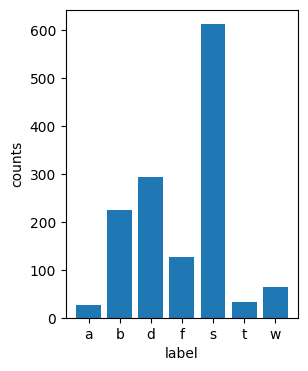

In [146]:
u, c = np.unique(labels['df']['label'], return_counts=True)

plt.figure(figsize=(3,4))
plt.bar(u, c);
plt.xlabel('label');
plt.ylabel('counts');

fig = plt.gcf()
figname = 'labeledROIs_counts'
fig.savefig(savedir+figname+'.png',transparent=True)
fig.savefig(savedir+figname+'.svg',transparent=False)

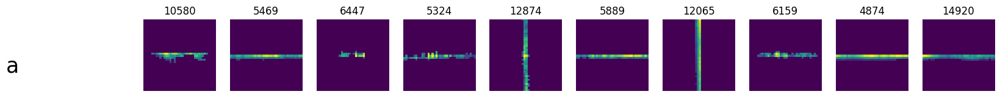

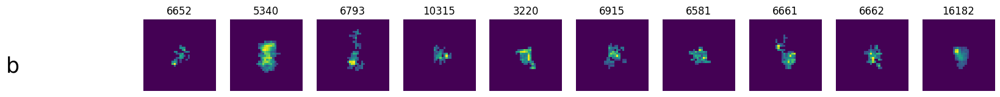

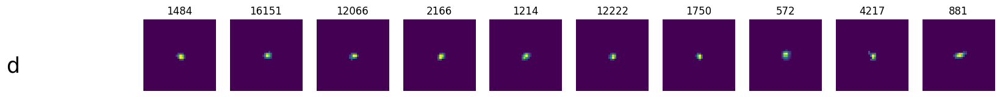

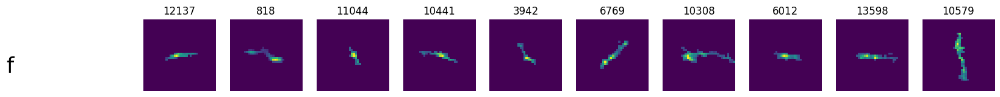

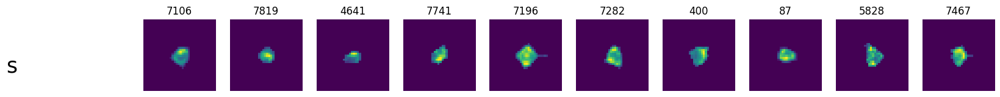

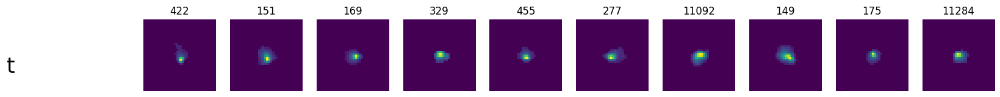

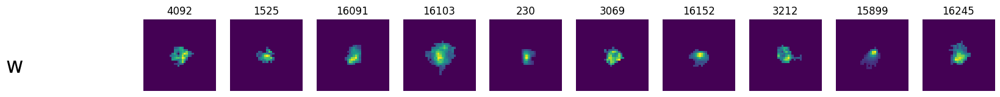

In [153]:
roicat.visualization.display_labeled_ROIs(
    images=images,
#     labels=labels['label'].astype(np.int64),
    labels=labels['df'],
    max_images_per_label=10,
    figsize=(18, 3),
    fontsize=25,
    shuffle=True,
)

fig = plt.gcf()
figname = 'labeledROIs_examples'
#fig.savefig(savedir+figname+'.png',transparent=True)
#fig.savefig(savedir+figname+'.svg',transparent=False)

# Save results

The results file can be opened using any of the following methods:
1. `roicat.helpers.pickle_load(path)`
2. `np.load(path)`
3. 
``` 
import pickle
with open(path_save, mode='rb') as f:
    test = pickle.load(f)
  ```

##### Make and save results

In [155]:
run_data = {
    "data": data.__dict__,
}
results = {
    "labels": labels,
    "images": images,
}

In [178]:
results['labels'].keys()

dict_keys(['list', 'dict', 'df'])

In [179]:
len(results['labels']['list'])

17190

In [157]:
## Define the directory to save the results to
dir_save = 'C:/Users/Samuel/Documents/2PI/mesoscope_active/roicat/'
name_save = 'SP058_2024-02-24_001'

paths_save = {
    'labels':   str(Path(dir_save) / f'{name_save}.labeling.labels.csv'),
    'latents':   str(Path(dir_save) / f'{name_save}.labeling.latents.pt'),
    'results':  str(Path(dir_save) / f'{name_save}.labeling.results.richfile'),
    'run_data': str(Path(dir_save) / f'{name_save}.labeling.run_data.richfile'),
}

## Save
labels['df'].to_csv(paths_save['labels'])
torch.save(roinet.latents, paths_save['latents'])
#roicat.util.RichFile_ROICaT(path=paths_save['results']).save(results, overwrite=True)
#roicat.util.RichFile_ROICaT(path=paths_save['run_data']).save(run_data, overwrite=True)

# Thank you
If you encountered any difficulties, please let us know at the issues page: https://github.com/RichieHakim/ROICaT/issues

---
# Extras

## Merge and convert GUI CSV files into a results file

##### 1. Make labels dictionary

In [160]:
import csv

# path_csv = r'/home/rich/Desktop/test.csv'  ## Path to the raw output .csv file from the GUI
path_csv = labeler.path_csv

with open(path_csv, 'r') as f:
    lines = np.array([line for line in csv.reader(f)], dtype=str)

labels_dict = {int(idx): label for idx, label in zip(lines[1:, 0], lines[1:, 1])}

In [175]:
labeler.path_csv

'C:\\Users\\Samuel\\AppData\\Local\\Temp\\roicat_labels_20250228_155749.csv'

##### 2. Make images array

In [ ]:
dir_data = r'/media/rich/bigSSD/downloads_tmp/tmp_data/mouse_0322R/statFiles/20230420/'


path_stat = str(Path(dir_data) / 'stat.npy')
path_ops = str(Path(dir_data) / 'ops.npy')

data = roicat.data_importing.Data_suite2p(
    paths_statFiles=[path_stat],
    paths_opsFiles=[path_ops],
    new_or_old_suite2p='new',
    verbose=True,
)

assert data.check_completeness(verbose=False)['classification_inference'], f"Data object is missing attributes necessary for tracking."

images = np.concatenate(data.ROI_images, axis=0)

In [181]:
for idx, label in labels_dict.items():
    print(idx)

2846
3533
3950
4087
4291
4779
4874
4901
5056
5324
5327
5402
5469
5889
5899
6159
12065
12103
12748
12874
12993
13461
13518
14920
14992
15014
15254
15076
8
11
15
23
28
35
36
39
40
49
54
56
58
59
63
71
82
87
92
99
100
102
103
108
114
115
119
122
123
131
135
145
146
546
561
573
579
582
583
584
588
592
601
605
608
613
629
719
735
874
900
1088
1394
1732
1921
2270
4404
4406
4408
4410
4426
4427
4433
4436
4439
4443
4450
4471
4478
4479
4481
4496
4498
4499
4509
4621
4698
4757
4845
4851
5828
7036
7043
7054
7056
7059
7063
7064
7068
7069
7072
7075
7076
7079
7081
7086
7087
7090
7091
7093
7096
7097
7098
7099
7103
7106
7107
7108
7109
7111
7113
7115
7116
7117
7120
7123
7130
7131
7133
7138
7139
7140
7141
7145
7146
7149
7150
7157
7158
7163
7169
7175
7196
7197
7210
7215
7218
7230
7236
7247
7261
7265
7266
7269
7273
7277
7278
7282
7291
7294
7297
7302
7306
7311
7312
7314
7316
7328
7340
7429
7430
7431
7432
7437
3527
3538
3740
4126
4296
4369
4392
5911
6118
6228
6257
6309
6379
6436
6474
6491
6509
6537
6562
6585


##### 3. Make the results dictionary

In [180]:
import pandas as pd

labels_list = ['None'] * len(results['labels']['list'])
for idx, label in labels_dict.items():
    labels_list[idx] = label

labels_df = pd.DataFrame(index=list(labels_dict.keys()), data=labels_list, columns=['label'])

labels = {
    'list': roicat.util.JSON_List(labels_list),
    'dict': roicat.util.JSON_Dict(labels_dict),
    'df': labels_df,
}

ValueError: Shape of passed values is (17190, 1), indices imply (1382, 1)

In [104]:
run_data = {
    "data": data.__dict__,
}
results = {
    "labels": labels,
    "images": images,
}

##### 4. Save the results dictionary

In [ ]:
## Define the directory to save the results to
dir_save = '/media/rich/bigSSD/data_tmp/test_data/'
name_save = 'mouse_1'

paths_save = {
    'labels':   str(Path(dir_save) / f'{name_save}.labeling.labels.json'),
    'results':  str(Path(dir_save) / f'{name_save}.labeling.results.richfile'),
    'run_data': str(Path(dir_save) / f'{name_save}.labeling.run_data.richfile'),
}

roicat.helpers.json_save(obj=roicat.util.JSON_List(labels['list']), filepath=paths_save['labels'])
roicat.util.RichFile_ROICaT(path=paths_save['results']).save(results, overwrite=True)
roicat.util.RichFile_ROICaT(path=paths_save['run_data']).save(run_data, overwrite=True)

##### SP. train & test classifier

In [184]:
unique_values

[np.str_('a'),
 np.str_('b'),
 np.str_('d'),
 np.str_('f'),
 np.str_('s'),
 np.str_('t'),
 np.str_('w')]

In [236]:
# Identify unique non-'None' values and assign indices
labs = labels_list
val_bool = [0, 0, 0, 0, 1, 1, 0] #mapping from label indices to 'bad' and 'good' ROIs

unique_values_orig = sorted(set(x for x in labs if x != 'None'))

#unique_values = unique_values_orig.copy() #OPTION 1: all classes
unique_values = ['bad', 'good'] #OPTION 2: 2 classes

#value_to_index = {v: i for i, v in enumerate(unique_values_orig)} #OPTION 1: all classes
value_to_index = {v: val_bool[i] for i, v in enumerate(unique_values_orig)} #OPTION 2: 2 classes

# Convert list to array with indices, keeping 'None' as None
class_labels_index = np.array([value_to_index[x] if x in value_to_index else None for x in labs], dtype=object)

In [237]:
X =  np.array(roinet.latents[class_labels_index!=None]).astype(np.float32)
y = class_labels_index[class_labels_index!=None].astype(np.int64)

In [238]:
autoclassifier = roicat.classification.classifier.Auto_LogisticRegression(
    X=X,
    y=y,
    params_LogisticRegression={
        'C': [1e-13, 1e3],
    },
    verbose=True,
)

C:\Users\Samuel\anaconda3\envs\ROICaT\Lib\site-packages\roicat\util.py:417: UserWarning:

RH WARNING: unable to get gcc version. Got error: [WinError 2] The system cannot find the file specified



In [239]:
autoclassifier.fit()

[I 2025-03-04 17:52:28,998] A new study created in memory with name: Autotuner


  0%|          | 0/150 [00:00<?, ?it/s]

[I 2025-03-04 17:52:29,025] Trial 0 finished with value: 0.5537972182364467 and parameters: {'C': 4.2078063412449584e-11}. Best is trial 0 with value: 0.5537972182364467.
[I 2025-03-04 17:52:29,048] Trial 1 finished with value: 32708.132921893844 and parameters: {'C': 0.03043125509933165}. Best is trial 0 with value: 0.5537972182364467.
[I 2025-03-04 17:52:29,068] Trial 2 finished with value: 0.09893921087392489 and parameters: {'C': 1.989975948202548e-08}. Best is trial 2 with value: 0.09893921087392489.
[I 2025-03-04 17:52:29,085] Trial 3 finished with value: 0.15329607924489044 and parameters: {'C': 3.212071155732517e-09}. Best is trial 2 with value: 0.09893921087392489.
[I 2025-03-04 17:52:29,112] Trial 4 finished with value: 515.2860909659554 and parameters: {'C': 0.00016680577527580727}. Best is trial 2 with value: 0.09893921087392489.
[I 2025-03-04 17:52:29,137] Trial 5 finished with value: 2264.4862903888757 and parameters: {'C': 0.0034503075734638117}. Best is trial 2 with val

(LogisticRegression(C=2.4118808627611412e-08,
                    class_weight={np.int64(0): np.float64(0.937584803256445),
                                  np.int64(1): np.float64(1.0713178294573644)}),
 {'C': 2.4118808627611412e-08})

In [240]:
#use suite2p features to train and test a logistic regression model (with the same labels). See if this does better or worse in the confusion matrix
#s2p_features = np.array([[s['skew'], s['std'], s['radius'], s['npix_norm'], s['npix'], s['aspect_ratio'], s['compact'], s['footprint'], s['solidity']] for s in stats_all])
s2p_features = np.array([[s['skew'], s['npix_norm'], s['compact']] for s in stats_all]) #the only 3 features used in the classifier
X_s2p =  np.array(s2p_features[class_labels_index!=None]).astype(np.float32)
#y = class_labels_index[class_labels_index!=None].astype(np.int64)

autoclassifier_s2p = roicat.classification.classifier.Auto_LogisticRegression(
    X=X_s2p,
    y=y,
    params_LogisticRegression={
        'C': [1e-13, 1e3],
    },
    verbose=True,
)

autoclassifier_s2p.fit()

C:\Users\Samuel\anaconda3\envs\ROICaT\Lib\site-packages\roicat\util.py:417: UserWarning:

RH WARNING: unable to get gcc version. Got error: [WinError 2] The system cannot find the file specified

[I 2025-03-04 17:52:34,555] A new study created in memory with name: Autotuner


  0%|          | 0/150 [00:00<?, ?it/s]

[I 2025-03-04 17:52:34,573] Trial 0 finished with value: 0.693106447447746 and parameters: {'C': 5.300657466058143e-13}. Best is trial 0 with value: 0.693106447447746.
[I 2025-03-04 17:52:34,581] Trial 1 finished with value: 0.6931063658457611 and parameters: {'C': 1.3506087306154695e-10}. Best is trial 1 with value: 0.6931063658457611.
[I 2025-03-04 17:52:34,592] Trial 2 finished with value: 0.6931064451890847 and parameters: {'C': 2.9056315726822165e-13}. Best is trial 1 with value: 0.6931063658457611.
[I 2025-03-04 17:52:34,603] Trial 3 finished with value: 0.2118856912949303 and parameters: {'C': 0.5976667671088065}. Best is trial 3 with value: 0.2118856912949303.
[I 2025-03-04 17:52:34,613] Trial 4 finished with value: 0.6931064463178459 and parameters: {'C': 2.767753154959992e-12}. Best is trial 3 with value: 0.2118856912949303.
[I 2025-03-04 17:52:34,623] Trial 5 finished with value: 0.6931064276411586 and parameters: {'C': 4.647047208312643e-11}. Best is trial 3 with value: 0.2

(LogisticRegression(C=15.486478637968137,
                    class_weight={np.int64(0): np.float64(0.937584803256445),
                                  np.int64(1): np.float64(1.0713178294573644)}),
 {'C': 15.486478637968137})

In [241]:
all_features = np.concatenate((s2p_features,roinet.latents.detach().cpu().numpy()),axis=1)

X_all =  np.array(all_features[class_labels_index!=None]).astype(np.float32)
#y = class_labels_index[class_labels_index!=None].astype(np.int64)

autoclassifier_all = roicat.classification.classifier.Auto_LogisticRegression(
    X=X_all,
    y=y,
    params_LogisticRegression={
        'C': [1e-13, 1e3],
    },
    verbose=True,
)

autoclassifier_all.fit()

C:\Users\Samuel\anaconda3\envs\ROICaT\Lib\site-packages\roicat\util.py:417: UserWarning:

RH WARNING: unable to get gcc version. Got error: [WinError 2] The system cannot find the file specified

[I 2025-03-04 17:52:43,016] A new study created in memory with name: Autotuner


  0%|          | 0/150 [00:00<?, ?it/s]

[I 2025-03-04 17:52:43,041] Trial 0 finished with value: 24543644.16882411 and parameters: {'C': 310.09825555637383}. Best is trial 0 with value: 24543644.16882411.
[I 2025-03-04 17:52:43,066] Trial 1 finished with value: 149.7043141251138 and parameters: {'C': 0.00019436097902173863}. Best is trial 1 with value: 149.7043141251138.
[I 2025-03-04 17:52:43,079] Trial 2 finished with value: 0.6591771298921968 and parameters: {'C': 8.152298534080728e-12}. Best is trial 2 with value: 0.6591771298921968.
[I 2025-03-04 17:52:43,103] Trial 3 finished with value: 17.230581908242 and parameters: {'C': 2.2449550568821685e-05}. Best is trial 2 with value: 0.6591771298921968.
[I 2025-03-04 17:52:43,133] Trial 4 finished with value: 1080.1927284189267 and parameters: {'C': 0.002389176978225707}. Best is trial 2 with value: 0.6591771298921968.
[I 2025-03-04 17:52:43,159] Trial 5 finished with value: 38140.509239638304 and parameters: {'C': 0.03607093554066044}. Best is trial 2 with value: 0.659177129

C:\Users\Samuel\anaconda3\envs\ROICaT\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



(LogisticRegression(C=4.997372953791296e-08,
                    class_weight={np.int64(0): np.float64(0.937584803256445),
                                  np.int64(1): np.float64(1.0713178294573644)}),
 {'C': 4.997372953791296e-08})

Accuracy: 0.9761215629522432


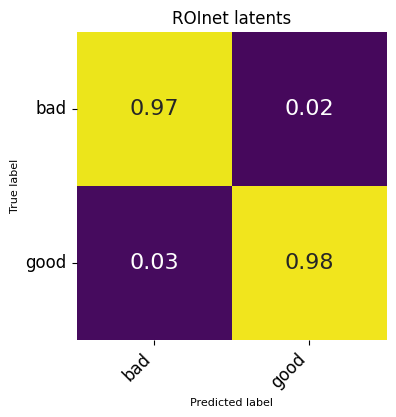

In [242]:
accuracy, confusion_matrix = autoclassifier.evaluate_model()

print(f"Accuracy: {accuracy}")

roicat.visualization.plot_confusion_matrix(
    confusion_matrix=confusion_matrix,
    class_names=unique_values, #unique_values_bool,
)

#change colormap after the fact
fig = plt.gcf()
ax = plt.gca()
im = None
for obj in ax.get_children():
    if isinstance(obj, plt.cm.ScalarMappable):
        im = obj
        break
if im:
    im.set_cmap('viridis')
    fig.canvas.draw_idle()
ax.set_title('ROInet latents')
plt.show()

figname = 'confusionMat_logisticClassifier_ROInet_2classes'
fig.savefig(savedir+figname+'.png',transparent=True)
fig.savefig(savedir+figname+'.svg',transparent=True)

Accuracy: 0.9204052098408104


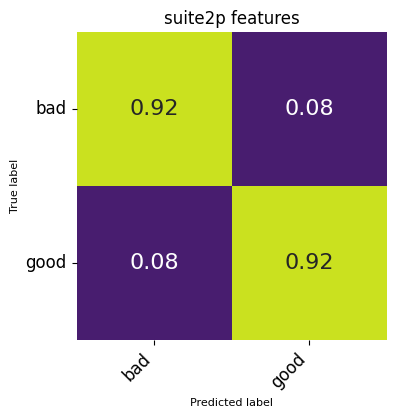

In [243]:
accuracy_s2p, confusion_matrix_s2p = autoclassifier_s2p.evaluate_model()

print(f"Accuracy: {accuracy_s2p}")

roicat.visualization.plot_confusion_matrix(
    confusion_matrix=confusion_matrix_s2p,
    class_names=unique_values, 
)

#change colormap after the fact
fig = plt.gcf()
ax = plt.gca()
im = None
for obj in ax.get_children():
    if isinstance(obj, plt.cm.ScalarMappable):
        im = obj
if im:
    im.set_cmap('viridis')
    fig.canvas.draw_idle()
ax.set_title('suite2p features')
plt.show()

figname = 'confusionMat_logisticClassifier_s2p_2classes'
fig.savefig(savedir+figname+'.png',transparent=True)
fig.savefig(savedir+figname+'.svg',transparent=True)

Accuracy: 0.9797395079594791


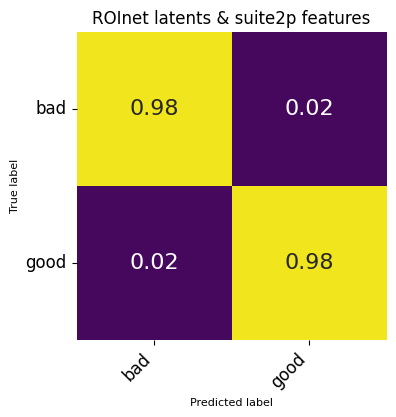

In [244]:
accuracy_all, confusion_matrix_all = autoclassifier_all.evaluate_model()

print(f"Accuracy: {accuracy_all}")

roicat.visualization.plot_confusion_matrix(
    confusion_matrix=confusion_matrix_all,
    class_names=unique_values, 
)

#change colormap after the fact
fig = plt.gcf()
ax = plt.gca()
im = None
for obj in ax.get_children():
    if isinstance(obj, plt.cm.ScalarMappable):
        im = obj
if im:
    im.set_cmap('viridis')
    fig.canvas.draw_idle()
ax.set_title('ROInet latents & suite2p features')
plt.show()

figname = 'confusionMat_logisticClassifier_ROInet+s2p_2classes'
fig.savefig(savedir+figname+'.png',transparent=True)
fig.savefig(savedir+figname+'.svg',transparent=True)

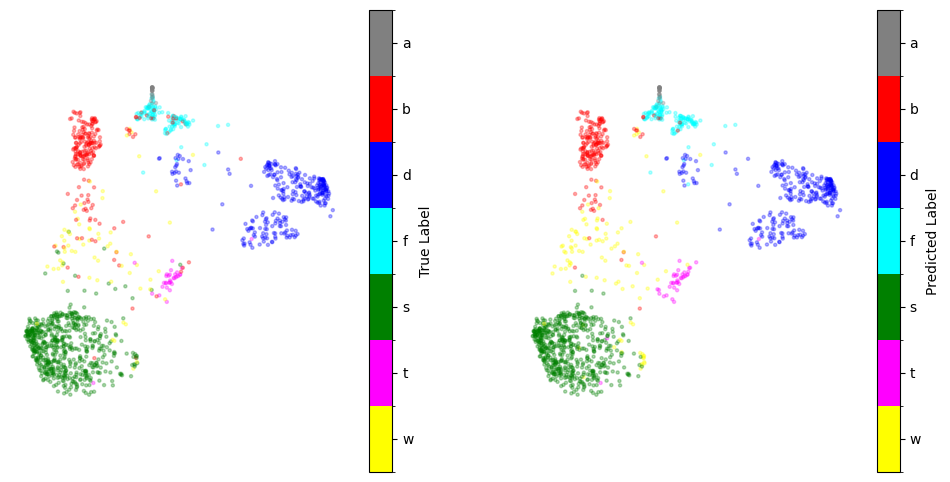

In [218]:
y_pred = autoclassifier.model_best.predict(X)

fig, ax = plt.subplots(nrows=1,ncols=2, figsize=(12,6), sharex=True, sharey=True)

cmap = mpl.colors.ListedColormap(['gray', 'red', 'blue', 'cyan', 'green', 'magenta', 'yellow'])
bounds = np.arange(-0.5,len(unique_values), 1) 
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

h0 = ax[0].scatter(emb[class_labels_index!=None,0],emb[class_labels_index!=None,1],5,y,alpha=0.3,cmap=cmap)
ax[0].set_box_aspect(1)
cbar = fig.colorbar(mpl.cm.ScalarMappable(cmap=cmap, norm=norm), ax=ax[0])
cbar.set_ticks(np.arange(len(unique_values)))
cbar.set_ticklabels(unique_values)  # Update labels as needed
cbar.set_label("True Label")
cbar.ax.invert_yaxis()
ax[0].axis('off')

h1 = ax[1].scatter(emb[class_labels_index!=None,0],emb[class_labels_index!=None,1],5,y_pred,alpha=0.3,cmap=cmap)
ax[1].set_box_aspect(1)
cbar = fig.colorbar(mpl.cm.ScalarMappable(cmap=cmap, norm=norm), ax=ax[1])
cbar.set_ticks(np.arange(len(unique_values)))
cbar.set_ticklabels(unique_values)  # Update labels as needed
cbar.set_label("Predicted Label")
cbar.ax.invert_yaxis()
ax[1].axis('off')

figname = 'emb_logisticClassifier_training'
fig.savefig(savedir+figname+'.png',transparent=True)
fig.savefig(savedir+figname+'.svg',transparent=True)

##### evaluate the classifier onto all of the data in the embedding

In [228]:
X_all = np.array(roinet.latents).astype(np.float32)
y_all_pred = autoclassifier.model_best.predict(X_all)
y_all_proba = autoclassifier.model_best.predict_proba(X_all)

X_new = np.array(roinet.latents[class_labels_index==None]).astype(np.float32)
y_new_pred = autoclassifier.model_best.predict(X_new)
y_new_proba = autoclassifier.model_best.predict_proba(X_new)

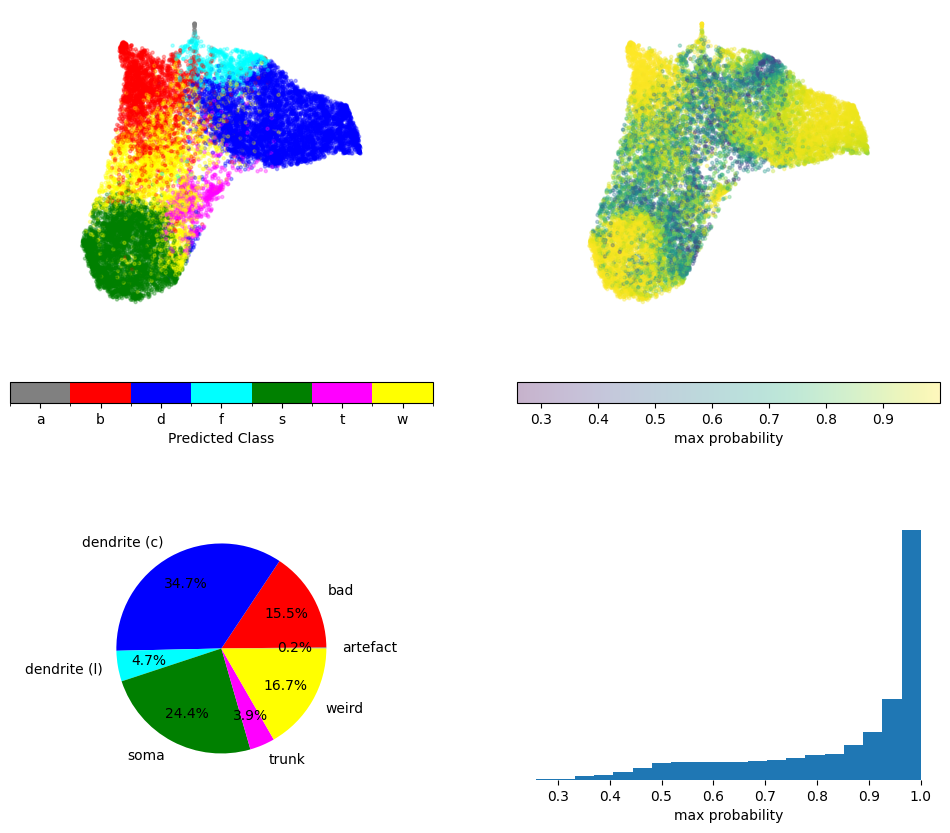

In [220]:
unique_values_text = ['artefact', 'bad', 'dendrite (c)', 'dendrite (l)', 'soma', 'trunk', 'weird']
(cnts,bin_edges) = np.histogram(y_all_pred,bins=len(unique_values))

fig, ax = plt.subplots(nrows=2,ncols=2, figsize=(12,10), height_ratios=[5, 3])

cols = ['gray', 'red', 'blue', 'cyan', 'green', 'magenta', 'yellow']
cmap = mpl.colors.ListedColormap(cols)
bounds = np.arange(-0.5,len(unique_values), 1) 
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

h0 = ax[0,0].scatter(emb[:,0],emb[:,1],5,y_all_pred,alpha=0.3,cmap=cmap)
ax[0,0].set_box_aspect(1)
cbar = fig.colorbar(mpl.cm.ScalarMappable(cmap=cmap, norm=norm), ax=ax[0,0], location='bottom')
cbar.set_ticks(np.arange(len(unique_values)))
cbar.set_ticklabels(unique_values)  # Update labels as needed
cbar.set_label("Predicted Class")
ax[0,0].axis('off')

h1 = ax[0,1].scatter(emb[:,0],emb[:,1],5,np.max(y_all_proba,axis=1),alpha=0.3, cmap='viridis')
ax[0,1].set_box_aspect(1)
plt.colorbar(h1, ax=ax[0,1], label = 'max probability', location='bottom')
ax[0,1].axis('off')

h2 = ax[1,0].pie(cnts, labels=unique_values_text, colors=cols, autopct='%1.1f%%', pctdistance=.7, labeldistance=1.15)
#ax[1,0].set_title("Predicted class")

h3 = ax[1,1].hist(np.max(y_all_proba,axis=1),bins=20)
ax[1,1].set_xlabel('max probability')
ax[1,1].get_yaxis().set_visible(False)
ax[1,1].spines['top'].set_visible(False)
ax[1,1].spines['right'].set_visible(False)
ax[1,1].spines['bottom'].set_visible(False)
ax[1,1].spines['left'].set_visible(False)

figname = 'emb_logisticClassifier'
fig.savefig(savedir+figname+'.png',transparent=True)
fig.savefig(savedir+figname+'.svg',transparent=True)

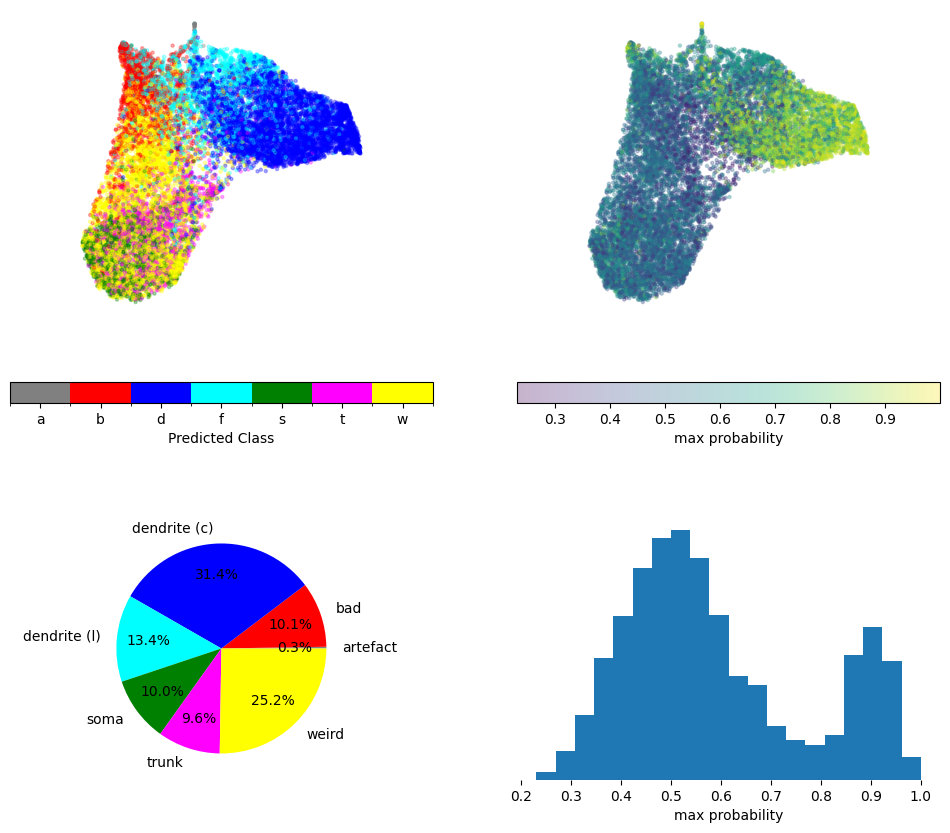

In [223]:
X_all =  np.array(s2p_features).astype(np.float32)
y_all_pred = autoclassifier_s2p.model_best.predict(X_all)
y_all_proba = autoclassifier_s2p.model_best.predict_proba(X_all)

(cnts,bin_edges) = np.histogram(y_all_pred,bins=len(unique_values))

fig, ax = plt.subplots(nrows=2,ncols=2, figsize=(12,10), height_ratios=[5, 3])

cols = ['gray', 'red', 'blue', 'cyan', 'green', 'magenta', 'yellow']
cmap = mpl.colors.ListedColormap(cols)
bounds = np.arange(-0.5,len(unique_values), 1) 
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

h0 = ax[0,0].scatter(emb[:,0],emb[:,1],5,y_all_pred,alpha=0.3,cmap=cmap)
ax[0,0].set_box_aspect(1)
cbar = fig.colorbar(mpl.cm.ScalarMappable(cmap=cmap, norm=norm), ax=ax[0,0], location='bottom')
cbar.set_ticks(np.arange(len(unique_values)))
cbar.set_ticklabels(unique_values)  # Update labels as needed
cbar.set_label("Predicted Class")
ax[0,0].axis('off')

h1 = ax[0,1].scatter(emb[:,0],emb[:,1],5,np.max(y_all_proba,axis=1),alpha=0.3, cmap='viridis')
ax[0,1].set_box_aspect(1)
plt.colorbar(h1, ax=ax[0,1], label = 'max probability', location='bottom')
ax[0,1].axis('off')

h2 = ax[1,0].pie(cnts, labels=unique_values_text, colors=cols, autopct='%1.1f%%', pctdistance=.7, labeldistance=1.15)
#ax[1,0].set_title("Predicted class")

h3 = ax[1,1].hist(np.max(y_all_proba,axis=1),bins=20)
ax[1,1].set_xlabel('max probability')
ax[1,1].get_yaxis().set_visible(False)
ax[1,1].spines['top'].set_visible(False)
ax[1,1].spines['right'].set_visible(False)
ax[1,1].spines['bottom'].set_visible(False)
ax[1,1].spines['left'].set_visible(False)

figname = 'emb_logisticClassifier_s2p'
fig.savefig(savedir+figname+'.png',transparent=True)
fig.savefig(savedir+figname+'.svg',transparent=True)

labels is a <class 'numpy.ndarray'>. Converting to a labels_dict by assuming that image indices are the same as the indices in labels.


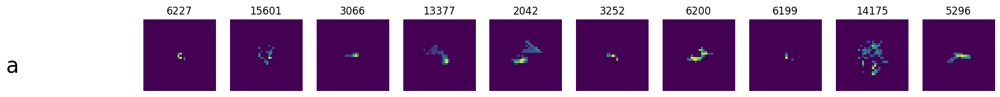

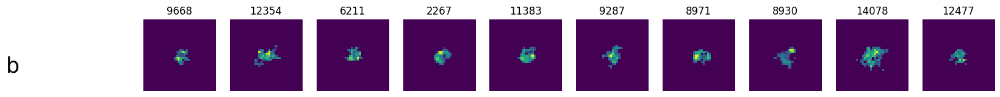

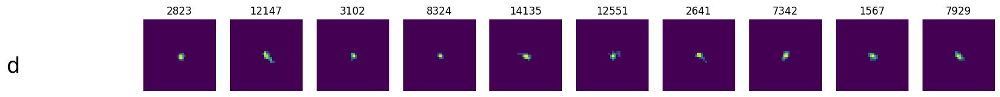

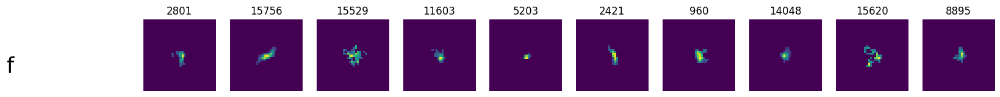

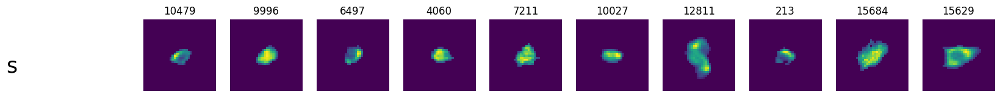

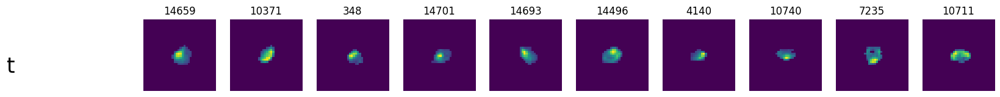

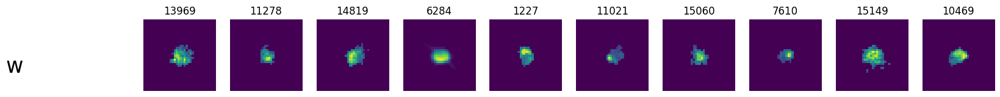

In [235]:
X_all =  np.array(s2p_features).astype(np.float32)
y_all_pred = autoclassifier_s2p.model_best.predict(X_all)

roicat.visualization.display_labeled_ROIs(
    images=images[class_labels_index==None],
#     labels=labels['label'].astype(np.int64),
    labels=np.array([unique_values[i] for i in y_all_pred[class_labels_index==None]]),
    max_images_per_label=10,
    figsize=(18, 3),
    fontsize=25,
    shuffle=True,
)